In [1]:
import yaml
import umap

import scanpy as sc
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pickle as pickle
import pandas as pd
# from carot.datasets.single_loader import CarModule
# from carot.utils import score_transports_and_targets_combinations
# from cmonge.utils import load_config
# from cmonge.trainers.ot_trainer import MongeMapTrainer

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [61]:
default_colors = {
    "blue": "#648FFF",
    "purple": "#785EF0",
    "pink": "#DC267F",
    "orange": "#FE6100",
    "yellow": "#FFB000",
    "grey": "#DDDDDD",
}

ot_map = {
    "source": default_colors["blue"],
    "target": default_colors["pink"],
    "transport": default_colors["yellow"],
    "rest": default_colors["grey"]
}

In [62]:
array_order = ["y_true", "mean_pred", "idx_de"]

# Model per CAR

In [63]:
base_fig_save = "/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Figures/transport_UMAPs/monge/"

In [64]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CAR_variants.txt", "r") as f:
    cars = f.read().splitlines()
cars

['41BB-41BB-z',
 '41BB-CD28-z',
 '41BB-CD40-z',
 '41BB-CTLA4-z',
 '41BB-IL15RA-z',
 '41BB-NA-z',
 'CD28-41BB-z',
 'CD28-CD28-z',
 'CD28-CD40-z',
 'CD28-CTLA4-z',
 'CD28-IL15RA-z',
 'CD28-NA-z',
 'CD40-41BB-z',
 'CD40-CD28-z',
 'CD40-CD40-z',
 'CD40-CTLA4-z',
 'CD40-IL15RA-z',
 'CD40-NA-z',
 'CTLA4-41BB-z',
 'CTLA4-CD28-z',
 'CTLA4-CD40-z',
 'CTLA4-CTLA4-z',
 'CTLA4-IL15RA-z',
 'CTLA4-NA-z',
 'IL15RA-41BB-z',
 'IL15RA-CD28-z',
 'IL15RA-CD40-z',
 'IL15RA-CTLA4-z',
 'IL15RA-IL15RA-z',
 'IL15RA-NA-z',
 'NA-NA-NA',
 'NA-NA-z']

## CD8

In [65]:
pred = []
cond = []
true = []
for car in cars:
    with open(f"/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/model_per_car/CD8/{car}/prediction_dict_test.pkl", "rb") as f:
        pred_dict = pickle.load(f)
    
        # Get mean predictions
        for k, v in pred_dict.items():
            cond.append(k)
            pred.append(pd.DataFrame(v[1]))
            true.append(pd.DataFrame(v[0]))



In [66]:
pred = pd.concat(pred, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
true = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()

res = pd.concat([pred, true], keys=["transport", "target"], names=["dtype", "index"]).reset_index("index", drop=True).reset_index()
res = res.drop_duplicates()

res[['CAR_Variant', 'Donor']] = [c.split("_") for c in res["car_donor"]]
res.loc[(res["CAR_Variant"]=="NA-NA-NA")&(res["dtype"]=="target"), "dtype"] = "source"

# Subsample the NA-NA-NA to 315 cells (maximum number of cells in a car variant) since we have A LOT of NA-NA-NA cells 
# as they occur in each individual pred_dict
res = res.sample(frac=1).groupby(["CAR_Variant", "dtype"]).head(315)
res = res.sort_values("dtype")

In [67]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8_chemCPA_anno.h5ad')
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper = umap.UMAP(random_state=1234)
Y1 = umapper.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y1

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/1311210156.py:8: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y1


In [68]:
Y2 = umapper.transform(res.loc[:, 0:81])
res.loc[:, ["UMAP1", "UMAP2"]] = Y2


/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


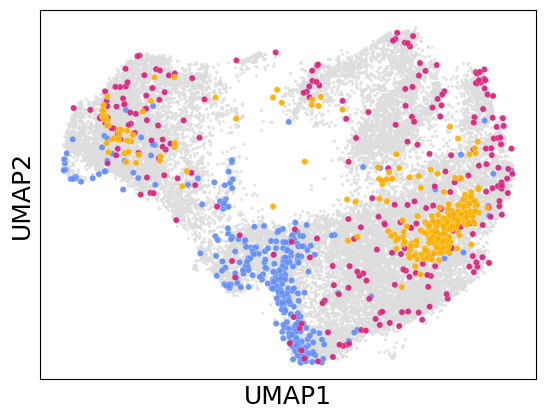

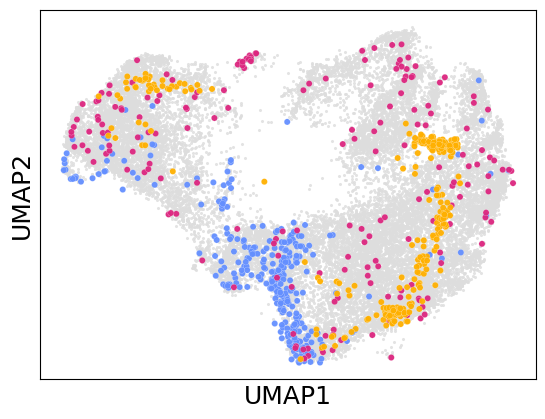

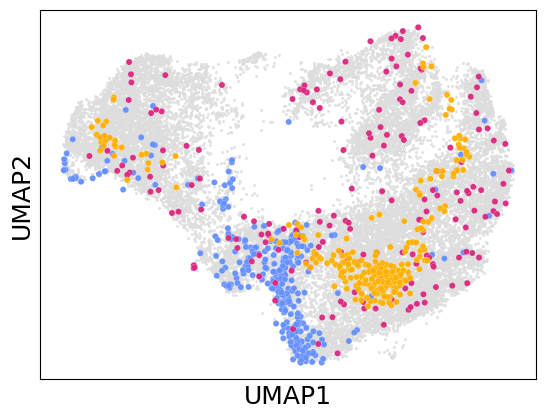

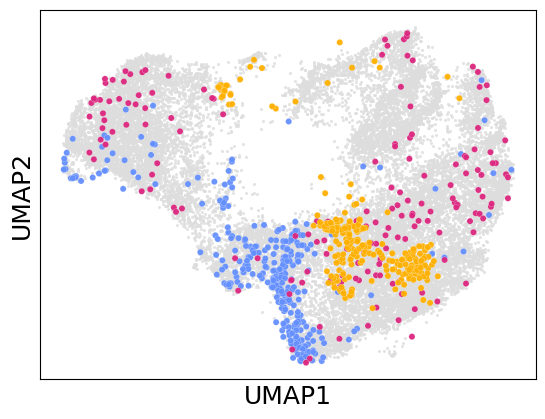

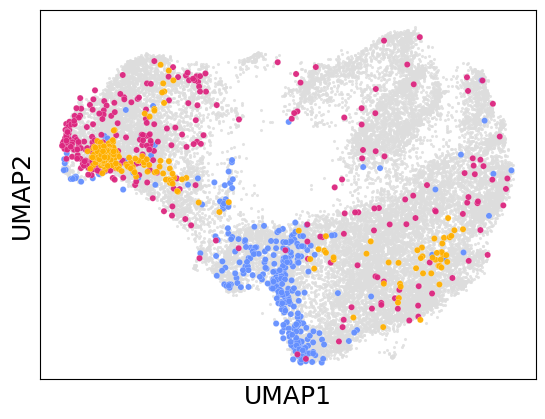

...

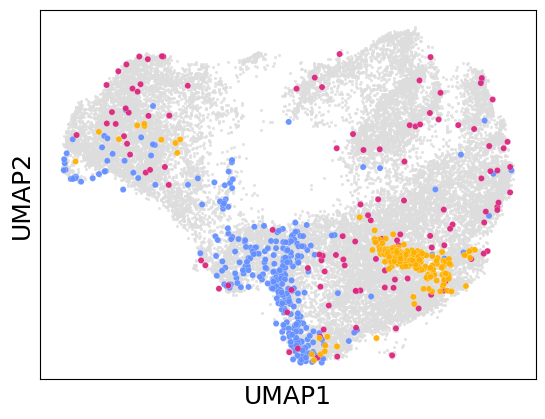

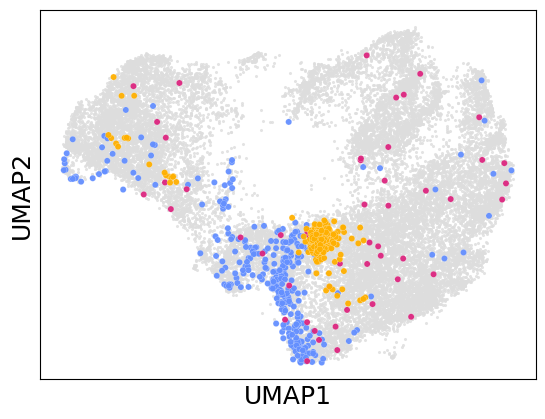

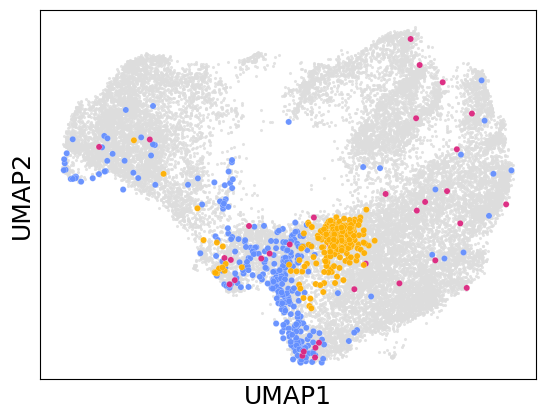

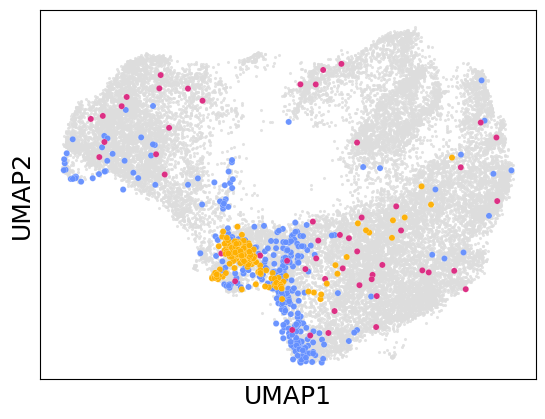

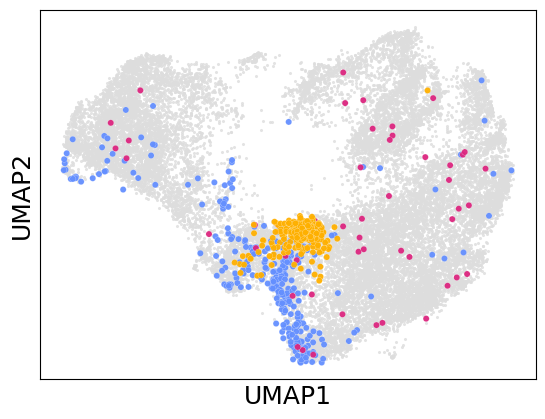

In [69]:
for car in res["CAR_Variant"].unique():
    if car=="NA-NA-NA":
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0)
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=20, palette=ot_map, alpha=0.95, linewidth=0.15)
    plt.legend([],[], frameon=False)
    plt.tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    plt.xlabel("UMAP1", fontsize=18)
    plt.ylabel("UMAP2", fontsize=18)

    plt.savefig(f"{base_fig_save}CD8_{car}_chemCPA_source_transport_target.pdf", bbox_inches="tight", dpi=300)
    plt.savefig(f"{base_fig_save}CD8_{car}_chemCPA_source_transport_target.png", bbox_inches="tight", dpi=300)
    plt.show()
    plt.close()

### All CARs - panels

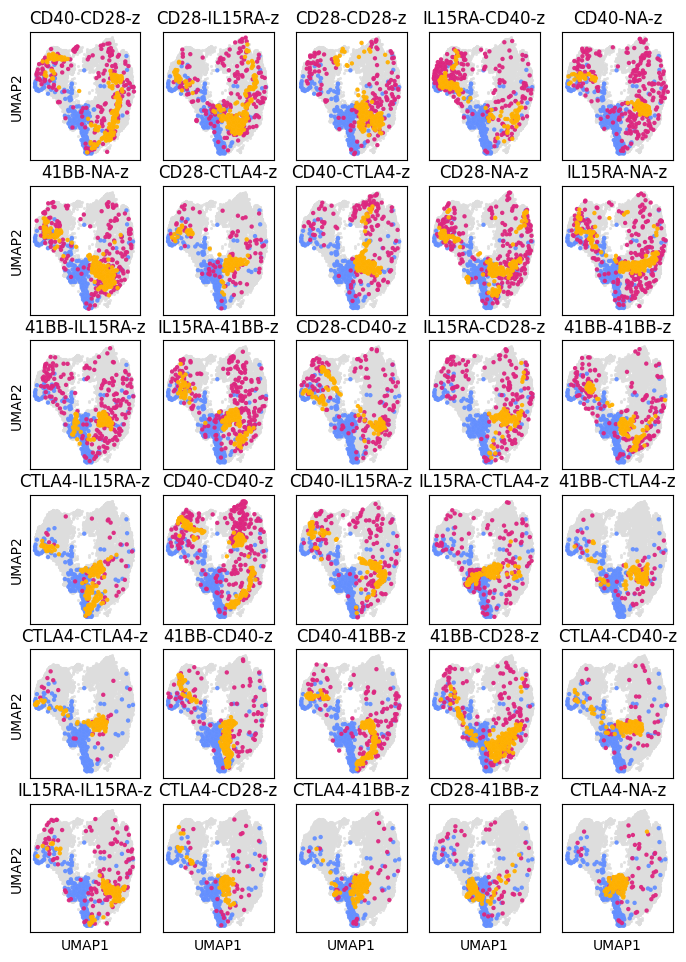

In [70]:
fig, axes = plt.subplots(nrows=6,ncols=5, sharex=True, sharey=True, figsize=(8.3, 11.7))
flat_axes = axes.flatten()
i =0
for car in res["CAR_Variant"].unique():
    if car in ["NA-NA-NA", "NA-NA-z"]:
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]
    

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0, ax=flat_axes[i])
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=10, palette=ot_map, alpha=0.95, linewidth=0.01, ax=flat_axes[i])    
    flat_axes[i].get_legend().remove()
    flat_axes[i].set_title(car)
    flat_axes[i].tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    i+=1
plt.savefig(f"{base_fig_save}CD8_chemCPA_all.pdf", bbox_inches="tight", dpi=300)
plt.show()

## CD4

In [71]:
pred = []
cond = []
true = []
for car in cars:
    with open(f"/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/model_per_car/CD4/{car}/prediction_dict_test.pkl", "rb") as f:
        pred_dict = pickle.load(f)
    
        # Get mean predictions
        for k, v in pred_dict.items():
            cond.append(k)
            pred.append(pd.DataFrame(v[1]))
            true.append(pd.DataFrame(v[0]))



In [72]:
pred = pd.concat(pred, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
true = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()

res = pd.concat([pred, true], keys=["transport", "target"], names=["dtype", "index"]).reset_index("index", drop=True).reset_index()
res = res.drop_duplicates()

res[['CAR_Variant', 'Donor']] = [c.split("_") for c in res["car_donor"]]
res.loc[(res["CAR_Variant"]=="NA-NA-NA")&(res["dtype"]=="target"), "dtype"] = "source"

# Subsample the NA-NA-NA to 315 cells (maximum number of cells in a car variant) since we have A LOT of NA-NA-NA cells 
# as they occur in each individual pred_dict
res = res.sample(frac=1).groupby(["CAR_Variant", "dtype"]).head(289)
res = res.sort_values("dtype")

In [73]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD4_chemCPA_anno.h5ad')
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper = umap.UMAP(random_state=1234)
Y1 = umapper.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y1

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/2085837836.py:8: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y1


In [74]:
Y2 = umapper.transform(res.loc[:, 0:81])
res.loc[:, ["UMAP1", "UMAP2"]] = Y2


/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


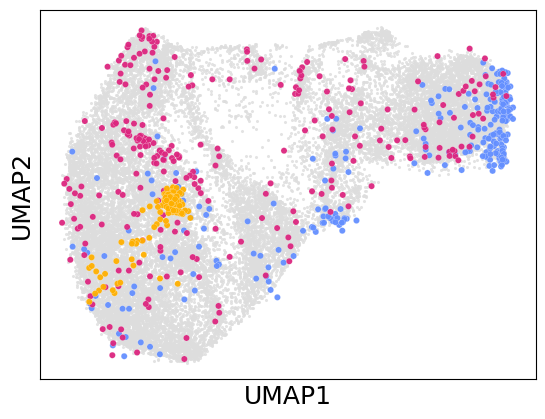

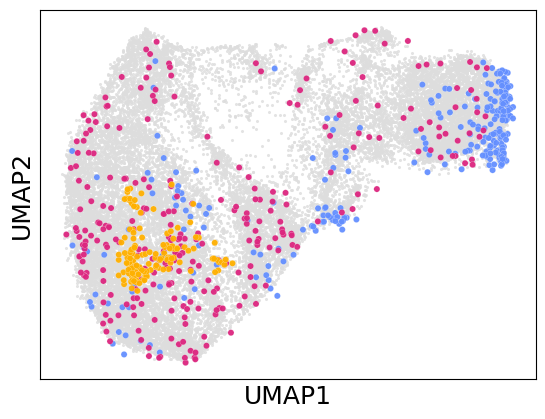

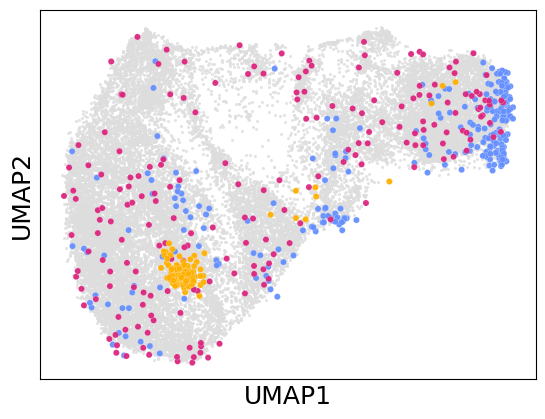

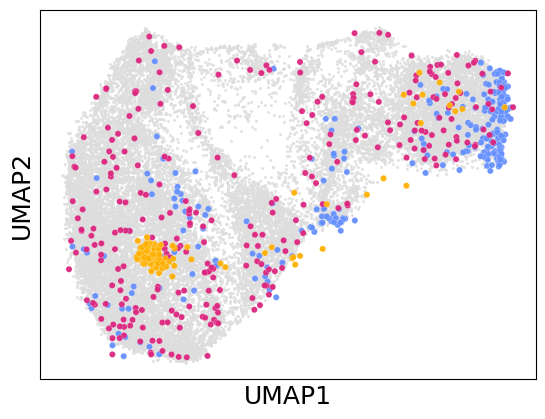

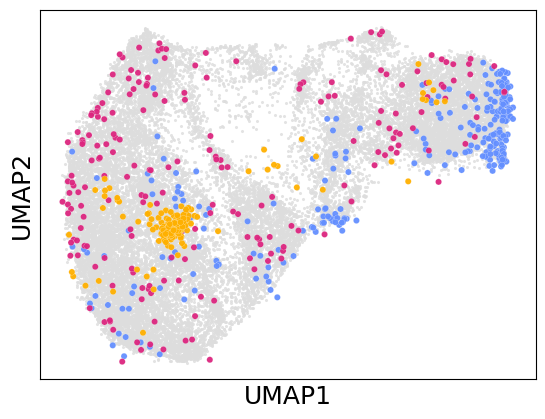

...

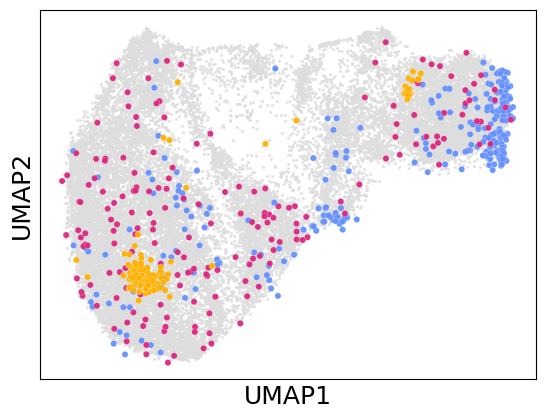

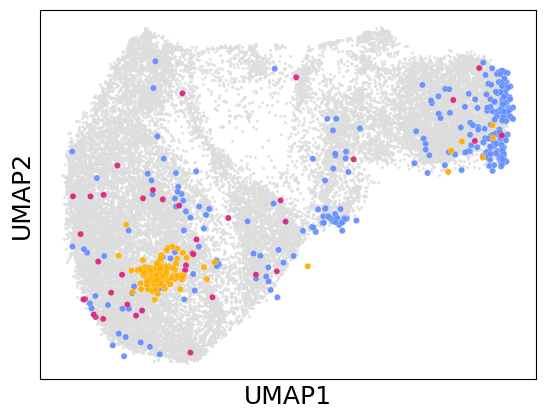

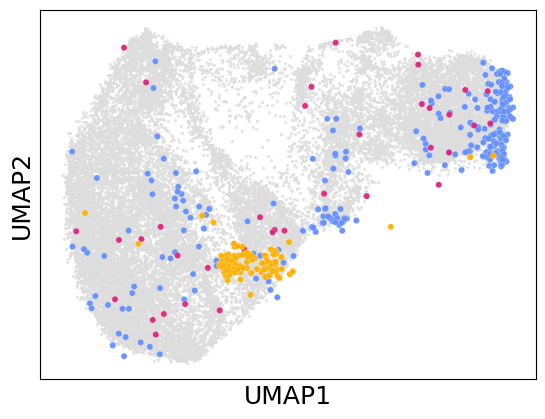

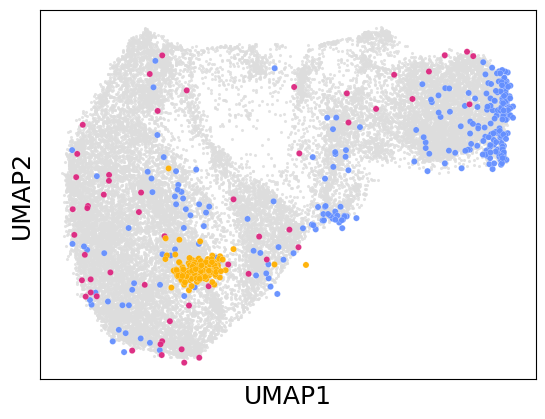

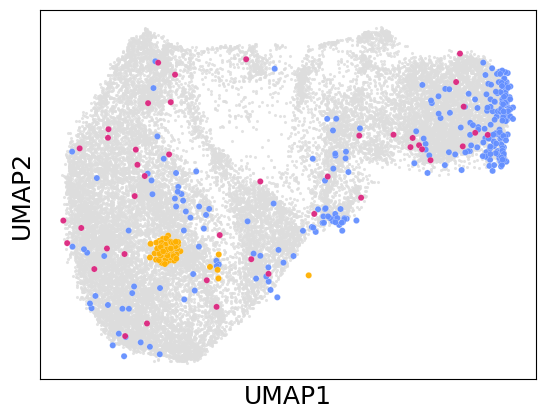

In [75]:
for car in res["CAR_Variant"].unique():
    if car=="NA-NA-NA":
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0)
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=20, palette=ot_map, alpha=0.95, linewidth=0.15)
    plt.legend([],[], frameon=False)
    plt.tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    plt.xlabel("UMAP1", fontsize=18)
    plt.ylabel("UMAP2", fontsize=18)

    plt.savefig(f"{base_fig_save}CD4_{car}_chemCPA_source_transport_target.pdf", bbox_inches="tight", dpi=300)
    plt.savefig(f"{base_fig_save}CD4_{car}_chemCPA_source_transport_target.png", bbox_inches="tight", dpi=300)
    plt.show()
    plt.close()

### All CARs - panels

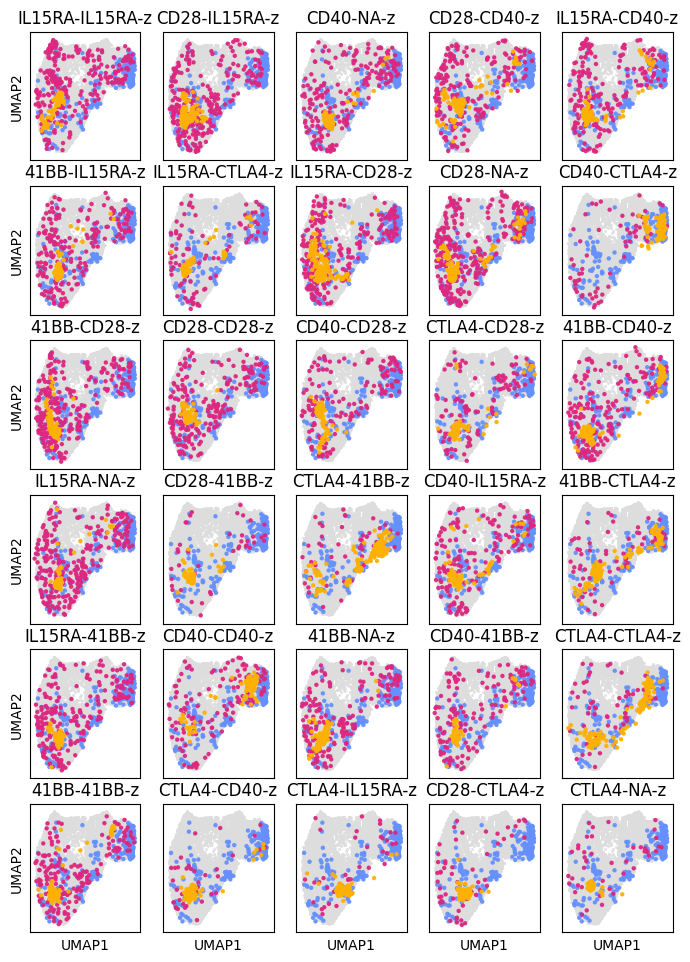

In [76]:
fig, axes = plt.subplots(nrows=6,ncols=5, sharex=True, sharey=True, figsize=(8.3, 11.7))
flat_axes = axes.flatten()
i =0
for car in res["CAR_Variant"].unique():
    if car in ["NA-NA-NA", "NA-NA-z"]:
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]
    

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0, ax=flat_axes[i])
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=10, palette=ot_map, alpha=0.95, linewidth=0.01, ax=flat_axes[i])    
    flat_axes[i].get_legend().remove()
    flat_axes[i].set_title(car)
    flat_axes[i].tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    i+=1
plt.savefig(f"{base_fig_save}CD4_chemCPA_all.pdf", bbox_inches="tight", dpi=300)
plt.show()

# Trained on multiple cars

In [77]:
base_fig_save = "/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Figures/transport_UMAPs/cmonge/"

## CD8

In [78]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/CD8_ID_dummy_donor/prediction_dict_test.pkl", "rb") as f:
    pred_dict = pickle.load(f)

In [79]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8_sel_cars.txt", "r") as f:
    cars = f.read().splitlines()
cars

['IL15RA-CD40-z',
 'CD40-CD40-z',
 'CD40-NA-z',
 'IL15RA-41BB-z',
 'IL15RA-CTLA4-z',
 'IL15RA-NA-z',
 'CD28-NA-z',
 '41BB-IL15RA-z',
 '41BB-NA-z',
 'CD40-CD28-z',
 'CD28-IL15RA-z',
 'CD28-CD28-z',
 'IL15RA-CD28-z',
 '41BB-41BB-z']

In [80]:
# Get mean predictions
pred = []
cond = []
true = []
for k, v in pred_dict.items():
    cond.append(k)
    pred.append(pd.DataFrame(v[1]))
    true.append(pd.DataFrame(v[0]))



In [81]:
pred = pd.concat(pred, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
true = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()

res = pd.concat([pred, true], keys=["transport", "target"], names=["dtype", "index"]).reset_index("index", drop=True).reset_index()

res[['CAR_Variant', 'Donor']] = [c.split("_") for c in res["car_donor"]]

res = res[[c in cars+["NA-NA-NA"] for c in res["CAR_Variant"]]]

res.loc[(res["CAR_Variant"]=="NA-NA-NA")&(res["dtype"]=="target"), "dtype"] = "source"
res = res.sort_values("dtype")

In [82]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8_chemCPA_anno.h5ad')
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper = umap.UMAP(random_state=1234)
Y1 = umapper.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y1

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/1311210156.py:8: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y1


In [83]:
Y2 = umapper.transform(res.loc[:, 0:81])
res.loc[:, ["UMAP1", "UMAP2"]] = Y2

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [84]:
for car in res["CAR_Variant"].unique():
    if car=="NA-NA-NA":
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0)
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=20, palette=ot_map, alpha=0.95, linewidth=0.15)
    plt.legend([],[], frameon=False)
    plt.tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    plt.xlabel("UMAP1", fontsize=18)
    plt.ylabel("UMAP2", fontsize=18)

    plt.savefig(f"{base_fig_save}sel_cars_CD8_{car}_chemCPA_source_transport_target.pdf", bbox_inches="tight", dpi=300)
    plt.savefig(f"{base_fig_save}sel_cars_CD8_{car}_chemCPA_source_transport_target.png", bbox_inches="tight", dpi=300)
    plt.close()

### All ID CARs - panels

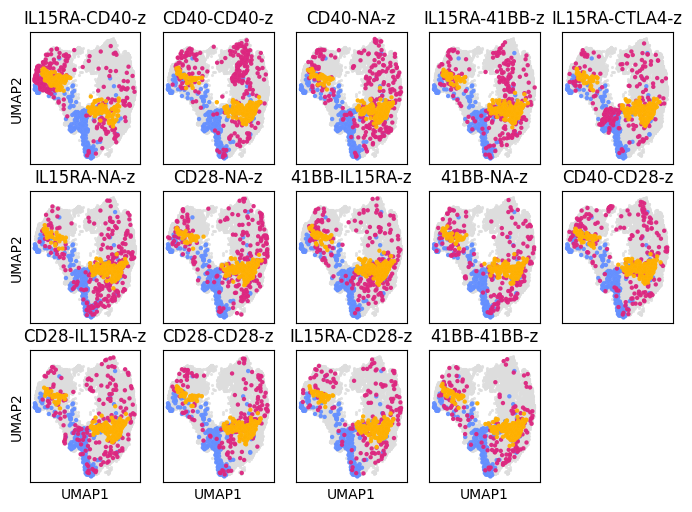

In [85]:
fig, axes = plt.subplots(nrows=3,ncols=5, sharex=True, sharey=True, figsize=(8.3, 5.85))
flat_axes = axes.flatten()
i =0
for car in cars:
    if car in ["NA-NA-NA", "NA-NA-z"]:
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]
    

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0, ax=flat_axes[i])
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=10, palette=ot_map, alpha=0.95, linewidth=0.01, ax=flat_axes[i])    
    flat_axes[i].get_legend().remove()
    flat_axes[i].set_title(car)
    flat_axes[i].tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    i+=1
fig.delaxes(flat_axes[-1])

plt.savefig(f"{base_fig_save}sel_cars_CD8_chemCPA_all.pdf", bbox_inches="tight", dpi=300)
plt.savefig(f"{base_fig_save}sel_cars_CD8_chemCPA_all.png", bbox_inches="tight", dpi=300)
plt.show()

## CD4

In [86]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD4_sel_cars.txt", "r") as f:
    cars = f.read().splitlines()
cars

['CD28-IL15RA-z',
 'CD28-NA-z',
 'IL15RA-NA-z',
 'IL15RA-IL15RA-z',
 '41BB-CD28-z',
 'IL15RA-CD28-z',
 'IL15RA-41BB-z',
 '41BB-IL15RA-z',
 'CD28-CD28-z',
 'CD28-CD40-z',
 'CD40-NA-z',
 'IL15RA-CD40-z',
 '41BB-CD40-z',
 '41BB-NA-z',
 '41BB-41BB-z',
 'CD40-IL15RA-z']

In [87]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/CD4_ID_dummy_donor/prediction_dict_test.pkl", "rb") as f:
    pred_dict = pickle.load(f)

# Get mean predictions
pred = []
cond = []
true = []
for k, v in pred_dict.items():
    cond.append(k)
    pred.append(pd.DataFrame(v[1]))
    true.append(pd.DataFrame(v[0]))

pred = pd.concat(pred, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
true = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()

res = pd.concat([pred, true], keys=["transport", "target"], names=["dtype", "index"]).reset_index("index", drop=True).reset_index()

In [88]:
res[['CAR_Variant', 'Donor']] = [c.split("_") for c in res["car_donor"]]

res = res[[c in cars+["NA-NA-NA"] for c in res["CAR_Variant"]]]

res.loc[(res["CAR_Variant"]=="NA-NA-NA")&(res["dtype"]=="target"), "dtype"] = "source"
res = res.sort_values("dtype")

In [89]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD4_chemCPA_anno.h5ad')
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper = umap.UMAP(random_state=1234)
Y1 = umapper.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y1

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/2085837836.py:8: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y1


In [90]:
Y2 = umapper.transform(res.loc[:, 0:81])
res.loc[:, ["UMAP1", "UMAP2"]] = Y2

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [91]:
for car in res["CAR_Variant"].unique():
    if car=="NA-NA-NA":
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0)
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=20, palette=ot_map, alpha=0.95, linewidth=0.15)
    plt.legend([],[], frameon=False)
    plt.tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    plt.xlabel("UMAP1", fontsize=18)
    plt.ylabel("UMAP2", fontsize=18)
    
    plt.savefig(f"{base_fig_save}sel_cars_CD4_{car}_chemCPA_source_transport_target.pdf", bbox_inches="tight", dpi=300)
    plt.savefig(f"{base_fig_save}sel_cars_CD4_{car}_chemCPA_source_transport_target.png", bbox_inches="tight", dpi=300)
    plt.close()

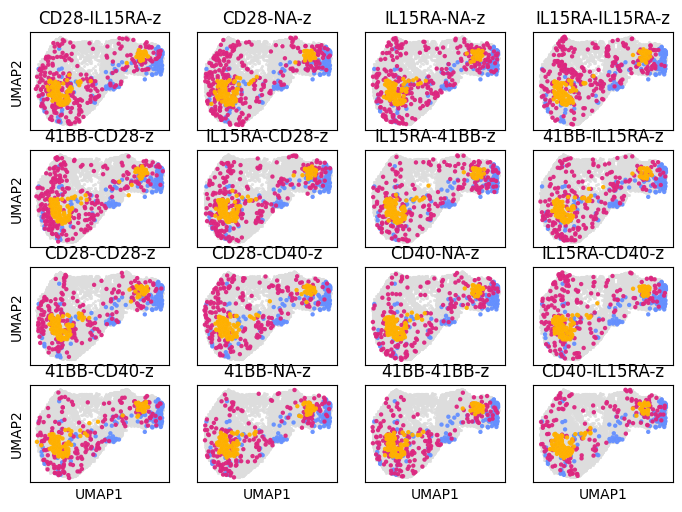

In [92]:
fig, axes = plt.subplots(nrows=4,ncols=4, sharex=True, sharey=True, figsize=(8.3, 5.85))
flat_axes = axes.flatten()
i =0
for car in cars:
    if car in ["NA-NA-NA", "NA-NA-z"]:
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]
    

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0, ax=flat_axes[i])
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=10, palette=ot_map, alpha=0.95, linewidth=0.01, ax=flat_axes[i])    
    flat_axes[i].get_legend().remove()
    flat_axes[i].set_title(car)
    flat_axes[i].tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    i+=1
plt.savefig(f"{base_fig_save}sel_cars_CD4_chemCPA_all.pdf", bbox_inches="tight", dpi=300)
plt.savefig(f"{base_fig_save}sel_cars_CD4_chemCPA_all.png", bbox_inches="tight", dpi=300)
plt.show()

# OOD - trained on multiple cars

In [93]:
base_fig_save = "/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Figures/transport_UMAPs/cmonge/"

## CD8

In [94]:
######## Get source cells #######
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/CD8_ID_dummy_donor/prediction_dict_test.pkl", "rb") as f:
    pred_dict = pickle.load(f)

# Get mean predictions
cond = []
true = []
for k, v in pred_dict.items():
    cond.append(k)
    true.append(pd.DataFrame(v[0]))

source = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
source[['CAR_Variant', 'Donor']] = [c.split("_") for c in source["car_donor"]]
source = source[source["CAR_Variant"]=="NA-NA-NA"]


In [95]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/CD8_OOD_dummy_donor/prediction_dict_ood.pkl", "rb") as f:
    pred_dict = pickle.load(f)

In [96]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8_sel_cars.txt", "r") as f:
    cars = f.read().splitlines()
cars

['IL15RA-CD40-z',
 'CD40-CD40-z',
 'CD40-NA-z',
 'IL15RA-41BB-z',
 'IL15RA-CTLA4-z',
 'IL15RA-NA-z',
 'CD28-NA-z',
 '41BB-IL15RA-z',
 '41BB-NA-z',
 'CD40-CD28-z',
 'CD28-IL15RA-z',
 'CD28-CD28-z',
 'IL15RA-CD28-z',
 '41BB-41BB-z']

In [97]:
# Get mean predictions
pred = []
cond = []
true = []
for k, v in pred_dict.items():
    cond.append(k)
    pred.append(pd.DataFrame(v[1]))
    true.append(pd.DataFrame(v[0]))



In [98]:
pred = pd.concat(pred, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
true = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
res = pd.concat([pred, true, source], keys=["transport", "target", "source"], names=["dtype", "index"]).reset_index("index", drop=True).reset_index()

res[['CAR_Variant', 'Donor']] = [c.split("_") for c in res["car_donor"]]

res = res[[c not in cars for c in res["CAR_Variant"]]]
res = res.sort_values("dtype")

In [99]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8_chemCPA_anno.h5ad')
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper = umap.UMAP(random_state=1234)
Y1 = umapper.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y1

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/1311210156.py:8: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y1


In [100]:
Y2 = umapper.transform(res.loc[:, 0:81])
res.loc[:, ["UMAP1", "UMAP2"]] = Y2

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [101]:
for car in res["CAR_Variant"].unique():
    if car=="NA-NA-NA":
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0)
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=20, palette=ot_map, alpha=0.95, linewidth=0.15)
    plt.legend([],[], frameon=False)
    plt.tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    plt.xlabel("UMAP1", fontsize=18)
    plt.ylabel("UMAP2", fontsize=18)

    plt.savefig(f"{base_fig_save}sel_cars_OOD_CD8_{car}_chemCPA_source_transport_target.pdf", bbox_inches="tight", dpi=300)
    plt.savefig(f"{base_fig_save}sel_cars_OOD_CD8_{car}_chemCPA_source_transport_target.png", bbox_inches="tight", dpi=300)
    plt.close()

### All OOD CARs - panels

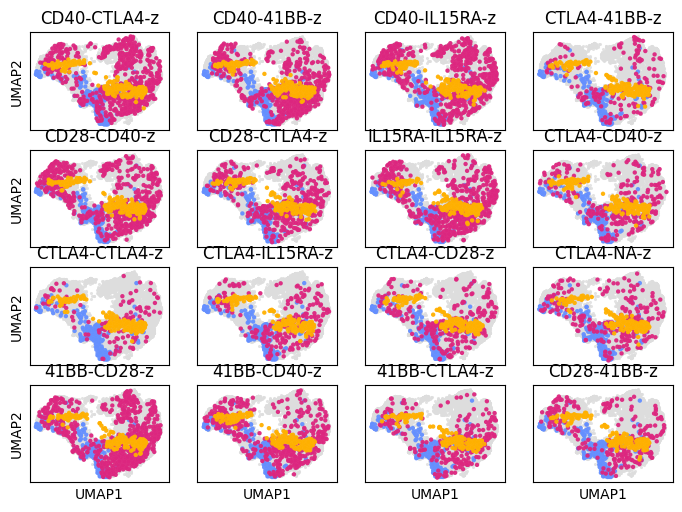

In [102]:
fig, axes = plt.subplots(nrows=4,ncols=4, sharex=True, sharey=True, figsize=(8.3, 5.85))
flat_axes = axes.flatten()
i =0
for car in res["CAR_Variant"].unique():
    if car in ["NA-NA-NA", "NA-NA-z"]:
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]
    sel_res = sel_res.sort_values("dtype")
    

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0, ax=flat_axes[i])
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=10, palette=ot_map, alpha=0.95, linewidth=0.01, ax=flat_axes[i])    
    flat_axes[i].get_legend().remove()
    flat_axes[i].set_title(car)
    flat_axes[i].tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    i+=1

plt.savefig(f"{base_fig_save}sel_cars_OOD_CD8_chemCPA_all.pdf", bbox_inches="tight", dpi=300)
plt.savefig(f"{base_fig_save}sel_cars_OOD_CD8_chemCPA_all.png", bbox_inches="tight", dpi=300)
plt.show()

## CD4

In [103]:
######## Get source cells #######
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/CD4_ID_dummy_donor/prediction_dict_test.pkl", "rb") as f:
    pred_dict = pickle.load(f)

# Get mean predictions
cond = []
true = []
for k, v in pred_dict.items():
    cond.append(k)
    true.append(pd.DataFrame(v[0]))

source = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
source[['CAR_Variant', 'Donor']] = [c.split("_") for c in source["car_donor"]]
source = source[source["CAR_Variant"]=="NA-NA-NA"]


In [104]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/chemCPA/CD4_OOD_dummy_donor/prediction_dict_ood.pkl", "rb") as f:
    pred_dict = pickle.load(f)

In [105]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD4_sel_cars.txt", "r") as f:
    cars = f.read().splitlines()
cars

['CD28-IL15RA-z',
 'CD28-NA-z',
 'IL15RA-NA-z',
 'IL15RA-IL15RA-z',
 '41BB-CD28-z',
 'IL15RA-CD28-z',
 'IL15RA-41BB-z',
 '41BB-IL15RA-z',
 'CD28-CD28-z',
 'CD28-CD40-z',
 'CD40-NA-z',
 'IL15RA-CD40-z',
 '41BB-CD40-z',
 '41BB-NA-z',
 '41BB-41BB-z',
 'CD40-IL15RA-z']

In [106]:
# Get mean predictions
pred = []
cond = []
true = []
for k, v in pred_dict.items():
    cond.append(k)
    pred.append(pd.DataFrame(v[1]))
    true.append(pd.DataFrame(v[0]))



In [107]:
pred = pd.concat(pred, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
true = pd.concat(true, keys=cond, names=["car_donor", "index"]).reset_index("index", drop=True).reset_index()
res = pd.concat([pred, true, source], keys=["transport", "target", "source"], names=["dtype", "index"]).reset_index("index", drop=True).reset_index()

res[['CAR_Variant', 'Donor']] = [c.split("_") for c in res["car_donor"]]

res = res[[c not in cars for c in res["CAR_Variant"]]]
res = res.sort_values("dtype")

In [108]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD4_chemCPA_anno.h5ad')
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper = umap.UMAP(random_state=1234)
Y1 = umapper.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y1

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/2085837836.py:8: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y1


In [109]:
Y2 = umapper.transform(res.loc[:, 0:81])
res.loc[:, ["UMAP1", "UMAP2"]] = Y2

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [110]:
for car in res["CAR_Variant"].unique():
    if car=="NA-NA-NA":
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0)
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=20, palette=ot_map, alpha=0.95, linewidth=0.15)
    plt.legend([],[], frameon=False)
    plt.tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    plt.xlabel("UMAP1", fontsize=18)
    plt.ylabel("UMAP2", fontsize=18)

    plt.savefig(f"{base_fig_save}sel_cars_OOD_CD4_{car}_chemCPA_source_transport_target.pdf", bbox_inches="tight", dpi=300)
    plt.savefig(f"{base_fig_save}sel_cars_OOD_CD4_{car}_chemCPA_source_transport_target.png", bbox_inches="tight", dpi=300)
    plt.close()

### All OOD CARs - panels

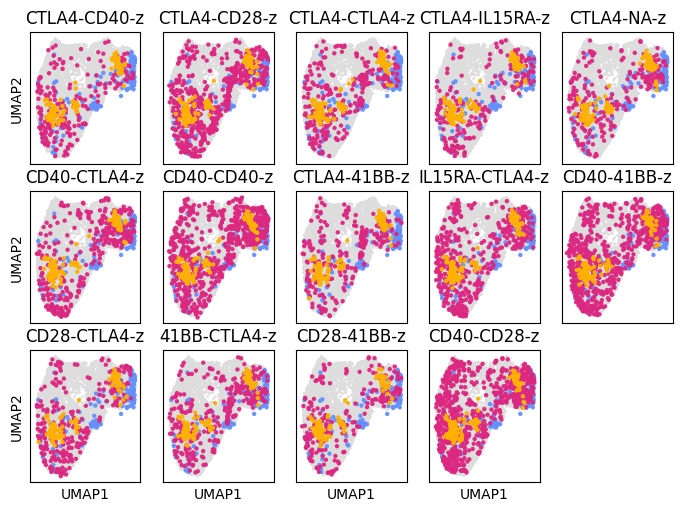

In [111]:
fig, axes = plt.subplots(nrows=3,ncols=5, sharex=True, sharey=True, figsize=(8.3, 5.85))
flat_axes = axes.flatten()
i =0
for car in res["CAR_Variant"].unique():
    if car in ["NA-NA-NA", "NA-NA-z"]:
        continue
    sel_res = res[(res["CAR_Variant"]==car)|(res["dtype"]=="source")]
    sel_res = sel_res.sort_values("dtype")
    

    sns.scatterplot(x=Y1[:, 0], y=Y1[:, 1], color=default_colors["grey"], s=5, alpha=0.8, linewidth=0, ax=flat_axes[i])
    sns.scatterplot(x=sel_res["UMAP1"], y=sel_res["UMAP2"], 
                    hue=sel_res["dtype"], s=10, palette=ot_map, alpha=0.95, linewidth=0.01, ax=flat_axes[i])    
    flat_axes[i].get_legend().remove()
    flat_axes[i].set_title(car)
    flat_axes[i].tick_params(which="both", axis="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    i+=1
fig.delaxes(flat_axes[-1])

plt.savefig(f"{base_fig_save}sel_cars_OOD_CD8_chemCPA_all.pdf", bbox_inches="tight", dpi=300)
plt.savefig(f"{base_fig_save}sel_cars_OOD_CD8_chemCPA_all.png", bbox_inches="tight", dpi=300)
plt.show()

# Compare logcounts of adatas

In [112]:
adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8.h5ad')

In [113]:
chemCPA_adata = sc.read_h5ad('/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/CD8_chemCPA_anno.h5ad')

In [114]:
adata.X = adata.layers['logcounts']
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/OT/functional_and_score_genes.txt", "r") as f:
    genes = f.read().splitlines()
sel_adata = adata[:, genes]
umapper2 = umap.UMAP(random_state=1234)
Y3 = umapper2.fit_transform(sel_adata.X)
sel_adata.obsm["X_umap"] = Y3

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/1251844646.py:7: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_adata.obsm["X_umap"] = Y3


In [115]:
len(genes)

82

In [116]:
chemCPA_adata.X = chemCPA_adata.layers['logcounts']
sel_chemCPA_adata = chemCPA_adata[:, genes]
umapper3 = umap.UMAP(random_state=1234)
Y4 = umapper3.fit_transform(sel_chemCPA_adata.X)
sel_chemCPA_adata.obsm["X_umap"] = Y4

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/var/folders/02/gztwz1tj1051mtt_ykv6v7940000gn/T/ipykernel_22690/1328377502.py:5: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  sel_chemCPA_adata.obsm["X_umap"] = Y4


<Axes: >

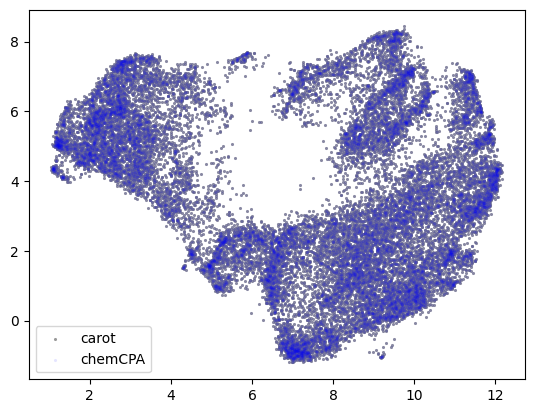

In [117]:
sns.scatterplot(x=Y3[:, 0], y=Y3[:, 1], color="grey", s=5, alpha=0.8, linewidth=0, label="carot")
sns.scatterplot(x=Y4[:, 0], y=Y4[:, 1], color="blue", s=5, alpha=0.1, linewidth=0, label="chemCPA")

<Axes: >

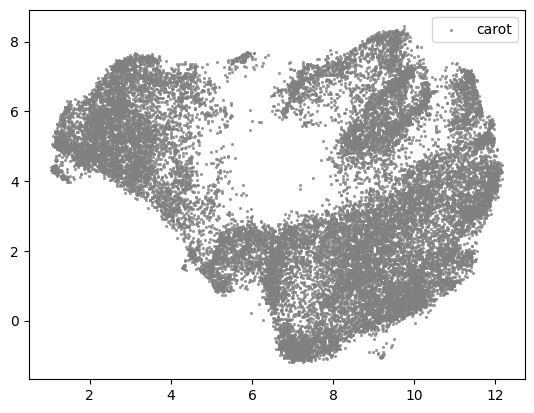

In [118]:
sns.scatterplot(x=Y3[:, 0], y=Y3[:, 1], color="grey", s=5, alpha=0.8, linewidth=0, label="carot")


<Axes: >

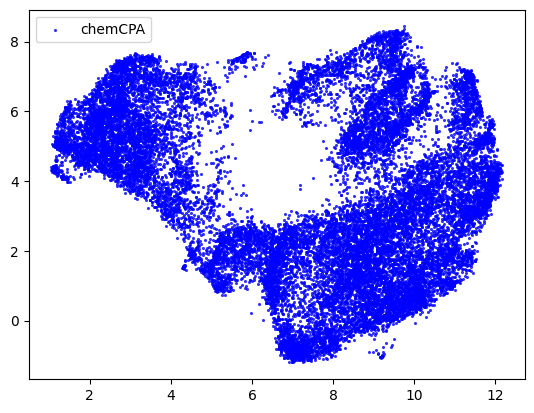

In [119]:
sns.scatterplot(x=Y4[:, 0], y=Y4[:, 1], color="blue", s=5, alpha=0.8, linewidth=0, label="chemCPA")